<a href="https://colab.research.google.com/github/oshizo/JapaneseEmbeddingEval/blob/main/sample_predictions_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install transformers

In [ ]:
!git clone https://github.com/oshizo/donut-base-japanese-visual-novel.git

In [ ]:
import re
import torch
from transformers import DonutProcessor, VisionEncoderDecoderModel

device = "cuda" if torch.cuda.is_available() else "cpu"
model_path = "oshizo/donut-base-japanese-visual-novel"

processor = DonutProcessor.from_pretrained(model_path)
model = VisionEncoderDecoderModel.from_pretrained(model_path).to(device).eval()

In [ ]:
from transformers import LogitsProcessor

# tokensを順番通りに生成することを強制するLogitsProcessor
class TokenOrderLogitsProcessor(LogitsProcessor):
    def __init__(self, tokens):
        self.tokens = tokens

    def __call__(self, input_ids: torch.LongTensor, scores: torch.FloatTensor) -> torch.FloatTensor:
        for irow in range(len(input_ids)):
            for i in range(len(self.tokens)):
                token = self.tokens[i]
                if token in input_ids[irow]:
                    # tokenがinput_idsに含まれる場合、そのtoken以前のtokenは出現させない（そのtokenを含む）
                    for j in range(i+1):
                        scores[irow][self.tokens[j]] = 0.0
                else:
                    # tokenがinput_idsに含まれない場合、そのtokenより後のtokenは出現させない
                    for j in range(i+1, len(self.tokens)):
                        scores[irow][self.tokens[j]] = 0.0
        return scores

In [ ]:
# タグトークンをこの順に生成する
tag_tokens = processor.tokenizer.encode(
    "<s_vnovel><s_options></s_options><s_names></s_names><s_messages></s_messages></s>", add_special_tokens=False)
tag_tokens

[59066, 59060, 59061, 59062, 59063, 59064, 59065, 2]

In [ ]:
from PIL import Image

def predict(image_path):
    image = Image.open(image_path).convert("RGB")
    task_prompt = "<s_vnovel>"
    decoder_input_ids = processor.tokenizer(task_prompt, add_special_tokens=False, return_tensors="pt").input_ids
    pixel_values = processor(image, return_tensors="pt").pixel_values

    outputs = model.generate(
        pixel_values.to(device),
        decoder_input_ids=decoder_input_ids.to(device),
        max_length=model.decoder.config.max_position_embeddings,
        early_stopping=True,
        pad_token_id=processor.tokenizer.pad_token_id,
        eos_token_id=processor.tokenizer.eos_token_id,
        use_cache=True,
        num_beams=1,
        bad_words_ids=[[processor.tokenizer.unk_token_id]],
        return_dict_in_generate=True,
        logits_processor=[TokenOrderLogitsProcessor(tag_tokens)]
    )

    sequence = processor.batch_decode(outputs.sequences)[0]
    sequence = sequence.replace(processor.tokenizer.eos_token, "").replace(processor.tokenizer.pad_token, "")
    sequence = re.sub(r"<.*?>", "", sequence, count=1).strip()

    return sequence, processor.token2json(sequence), image

<s_options></s_options><s_names> 結月</s_names><s_messages> この神社には古い言い伝えがあるの。神樹の下で誓いを立てると、その願いは必ず叶うという。心を開いて、自分の想いを信じてみて。</s_messages>
{'options': '', 'names': '結月', 'messages': 'この神社には古い言い伝えがあるの。神樹の下で誓いを立てると、その願いは必ず叶うという。心を開いて、自分の想いを信じてみて。'}


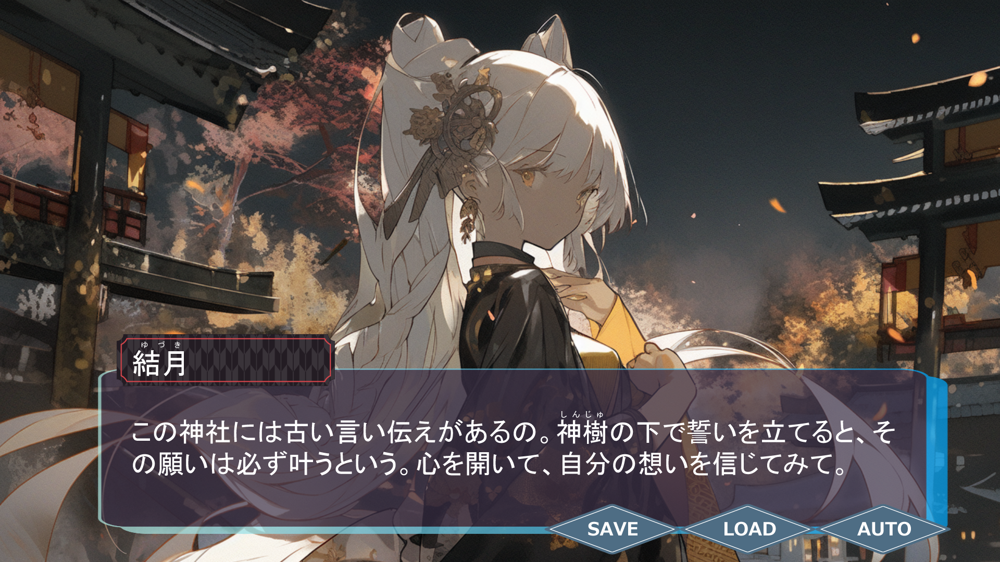

---

<s_options> 行こう!<sep/>今回は見送る<sep/>準備を整えるまで待って(会話から抜けます)<sep/>旅の目的について詳しく教えてください</s_options><s_names> リリアン</s_names><s_messages> 私たちの使命は、新たな発見と交流を通じて地球と宇宙の未来を築くこと。この壮大な旅に参加する準備はできているかしら?</s_messages>
{'options': ['行こう!', '今回は見送る', '準備を整えるまで待って(会話から抜けます)', '旅の目的について詳しく教えてください'], 'names': 'リリアン', 'messages': '私たちの使命は、新たな発見と交流を通じて地球と宇宙の未来を築くこと。この壮大な旅に参加する準備はできているかしら?'}


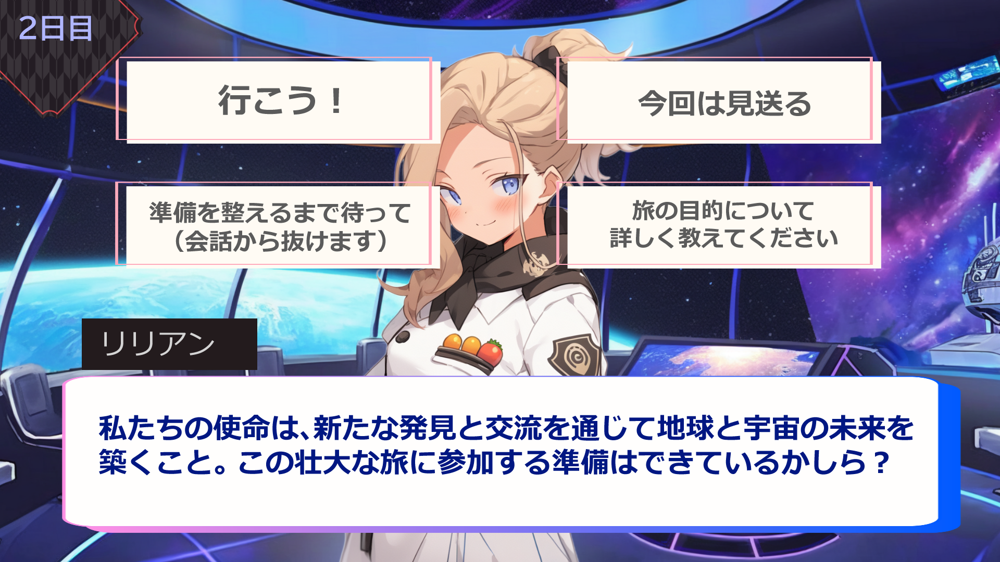

---

<s_options> 全力で攻撃する!勝利をつかめ!<sep/>堅実に守り、敵の隙を待とう。</s_options><s_names></s_names><s_messages> 敵を誘い込んで、戦術を駆使せよ。</s_messages>
{'options': ['全力で攻撃する!勝利をつかめ!', '堅実に守り、敵の隙を待とう。'], 'names': '', 'messages': '敵を誘い込んで、戦術を駆使せよ。'}


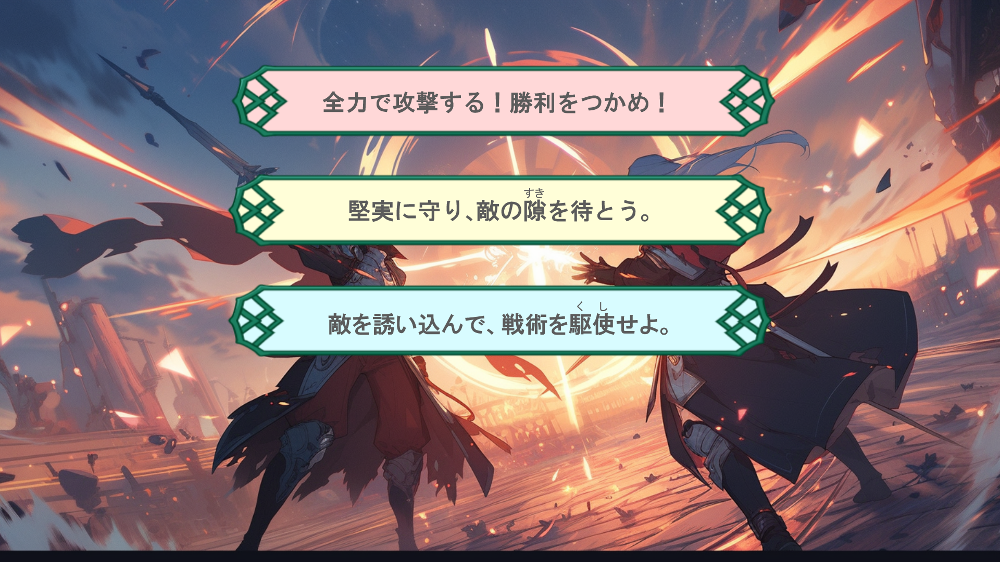

---

<s_options> もちろん、手伝います!</s_options><s_names> 下尾崎 菊欠郎</s_names><s_messages> この書斎は重要な手がかりが隠されているかもしれない。君も協力してくれるか?</s_messages>
{'options': 'もちろん、手伝います!', 'names': '下尾崎 菊欠郎', 'messages': 'この書斎は重要な手がかりが隠されているかもしれない。君も協力してくれるか?'}


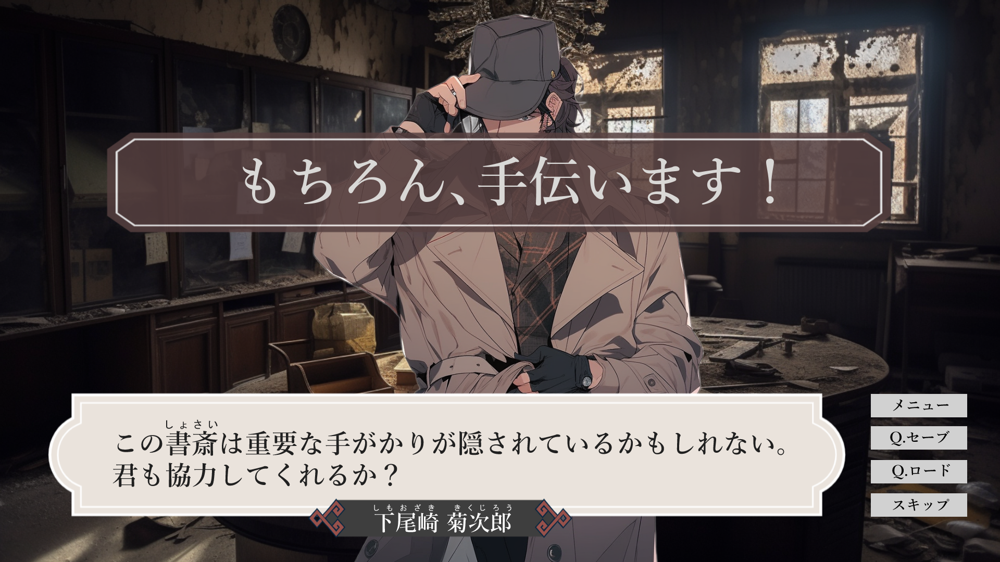

---

In [7]:
import IPython
from IPython.display import Markdown

for image_path in [
    "/content/donut-base-japanese-visual-novel/sample_images/sample_01.png",
    "/content/donut-base-japanese-visual-novel/sample_images/sample_02.png",
    "/content/donut-base-japanese-visual-novel/sample_images/sample_03.png",
    "/content/donut-base-japanese-visual-novel/sample_images/sample_04.png",
]:
    sequence, json_output,image = predict(image_path)
    print(sequence)
    print(json_output)
    display(IPython.display.Image(image_path, width=500))
    display(Markdown("---"))